In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import openslide
from probreg import cpd
from probreg import transformation as tf
import cv2
from PIL import Image
from pathlib import Path
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

from sklearn.neighbors import LocalOutlierFactor

In [3]:
## HACK get rid of it
import sys
sys.path.append("..")
from registration_tree import Rect, QuadTree

In [4]:
from registration_tree import Rect, QuadTree

In [5]:
Path("../../Slides/Colon/D2-40/CRC-A1-5_stitched.tif").exists()

True

In [9]:
source_slide = openslide.OpenSlide(f'D:/Datasets/ColonCancer/UKSH-HE/CRC-AI-5 D X40 IHC.tif')
target_slide = openslide.OpenSlide(f'D:/Datasets/ColonCancer/UKSH-HE/CRC-A1-5 40X.tif')

source_dimension = Rect.create(Rect, 0, 0, source_slide.dimensions[0], source_slide.dimensions[1])
target_dimension = Rect.create(Rect, 0, 0, target_slide.dimensions[0], target_slide.dimensions[1])

In [10]:
%%time
qtree = QuadTree(source_dimension, source_slide, target_dimension, target_slide, target_depth=0, debug=True)
print(qtree)

Source: CRC-AI-5 D X40 IHC 
Target: CRC-A1-5 40X 
Source: (0.00, 0.00, 94752.00, 102768.00) Target: (0.00, 0.00, 97840.00, 105536.00)
x: [0.992, 0.114, -2587.438], y: [-0.008, 1.102, -3236.772]] q: 912.147
Wall time: 1.55 s


(<Figure size 3456x3456 with 16 Axes>, None)

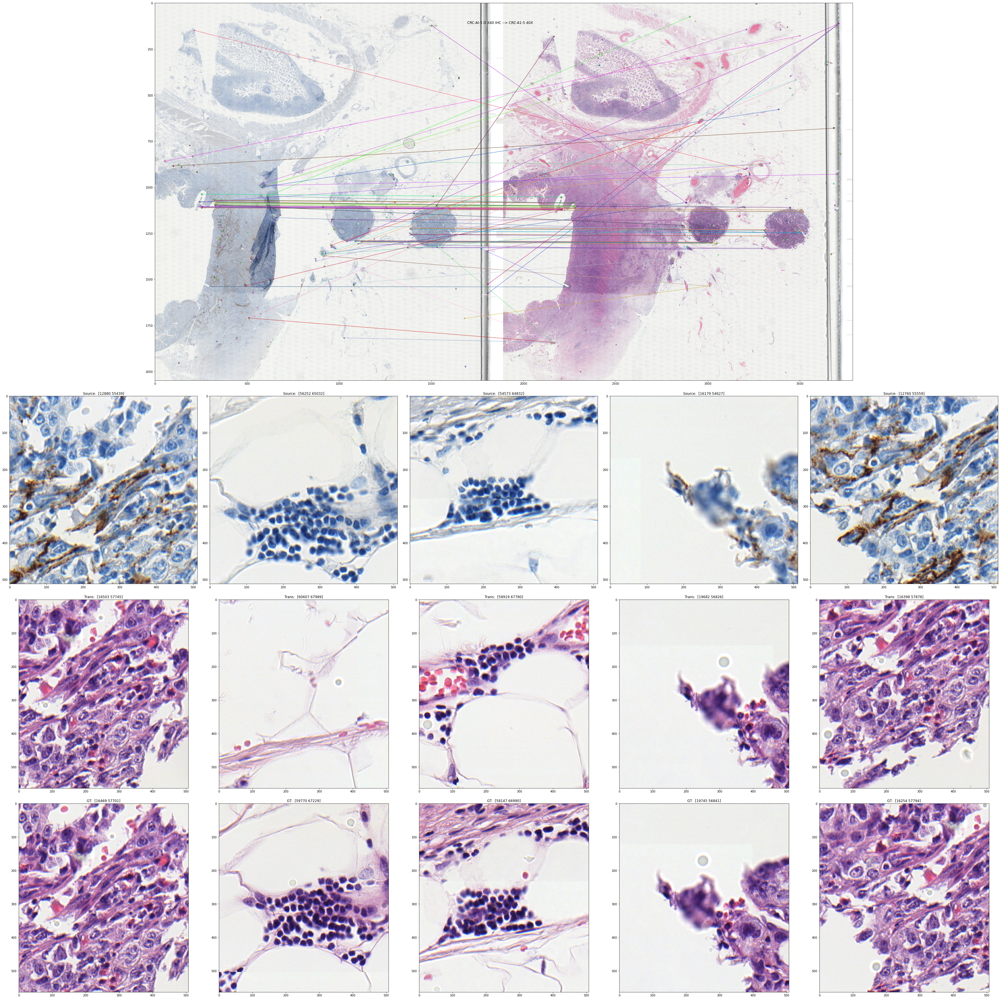

In [11]:
qtree.draw_feature_points(num_sub_pic=5, figsize=(48, 48)) # num_sub_pic=2, figsize=(48, 48)